$$
    \newcommand{\genericdel}[3]{%
      \left#1#3\right#2
    }
    \newcommand{\del}[1]{\genericdel(){#1}}
    \newcommand{\sbr}[1]{\genericdel[]{#1}}
    \newcommand{\cbr}[1]{\genericdel\{\}{#1}}
    \newcommand{\abs}[1]{\genericdel||{#1}}
    \DeclareMathOperator*{\argmin}{arg\,min}
    \DeclareMathOperator*{\argmax}{arg\,max}
    \DeclareMathOperator{\Pr}{\mathbb{p}}
    \DeclareMathOperator{\E}{\mathbb{E}}
    \DeclareMathOperator{\Ind}{\mathbb{I}}
    \DeclareMathOperator{\var}{var}
    \DeclareMathOperator{\cov}{cov}
    \newcommand{\bnaive}{\widehat{\beta}}
    \newcommand{\bbayes}{\widetilde{\beta}}
    \newcommand{\bboot}{\beta^{*}}
    \newcommand{\bdouble}{\beta^{**}}
    \newcommand{\bbootnv}{\hat{\beta}^*}
    \newcommand{\bbootby}{\widetilde{\beta}^*}
    \newcommand{\bcorrect}{\beta^{\checkmark}}
    \newcommand{\bbayescorrect}{\widetilde{\beta}^{\checkmark}}
    \newcommand{\ybar}{\bar{Y}}
    \newcommand{\ypred}{\widetilde{y}}
    \newcommand{\ybarpred}{\widetilde{\bar{Y}}}
    \DeclareMathOperator{\invchi}{\mathrm{Inv-\chi}^2}
    \newcommand{\thresh}{\ybar{}_0}
    \newcommand{\muo}{\mu_{0}}
    \newcommand{\sigo}{\sigma_{0}}
    \newcommand{\hmt}{\bar{Y_t}}
    \newcommand{\hst}{s_t^2}
    \newcommand{\hmc}{\bar{Y_c}}
    \newcommand{\hsc}{s_c^2}
    \newcommand{\mt}{\mu_t}
    \newcommand{\sigt}{\sigma_t}
    \newcommand{\vt}{\sigma_t^2}
    \newcommand{\mc}{\mu_c}
    \newcommand{\vc}{\sigma_c^2}
    \newcommand{\sigc}{\sigma_c}
    \DeclareMathOperator*{\argmin}{arg\,min}
    \DeclareMathOperator*{\argmax}{arg\,max}
    \newcommand{\effect}{\mathrm{eff}}
    \newcommand{\xtilde}{\widetilde{X}}
    \DeclareMathOperator{\normal}{\mathcal{N}}
    \DeclareMathOperator{\unif}{Uniform}
    \newcommand{\below}{\unicode{x25E7}}
    \newcommand{\above}{\unicode{x25E8}}
    \newcommand{\discont}{\unicode{x25EB}}
    \newcommand{\jbelow}{\unicode{x21E5}}
    \newcommand{\jabove}{\unicode{x21E4}}
    \newcommand{\Xmax}{X_{\max}}
    \newcommand{\Xmin}{X_{\min}}
    \newcommand{\indep}{\perp}
$$

In [3]:
using Stan
using KernelDensity

INFO: Recompiling stale cache file /Users/imolk/Library/Julia/packages_experimental/lib/v0.6/Documenter.ji for module Documenter.
INFO: Recompiling stale cache file /Users/imolk/Library/Julia/packages_experimental/lib/v0.6/ForwardDiff.ji for module ForwardDiff.
INFO: Recompiling stale cache file /Users/imolk/Library/Julia/packages_experimental/lib/v0.6/KernelDensity.ji for module KernelDensity.


In [125]:
import PyPlot; plt=PyPlot
using LaTeXStrings
plt.rc("figure", dpi=300.0)
plt.rc("figure", figsize=(12,8))
plt.rc("savefig", dpi=300.0)
plt.rc("text", usetex=true)
plt.rc("font", family="serif")
plt.rc("font", serif="Palatino")
;
_pwd = pwd()

"/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks"

In [5]:
using Distributions

# Setup

In this experiment, we try to get closer to the application by giving each observation a different mean and standard deviation.

\begin{equation}
\begin{split}
X_i &\sim \normal \del{\mu_i, \sigma_i} \\
X_i & \indep X_j \forall i \neq j \\
\Xmax &= \max_i\cbr{X_i} \\
\Xmin &= \min_i\cbr{X_i}
\end{split}
\end{equation}

Let
\begin{equation}
\begin{split}
    \mu_i &= 10 + \sin\del{2\pi i / 50} \\
    \sigma_i &= 0.1+\cos^2\del{2\pi i / 50} \\
    i &= 1, 2, \ldots, 100
\end{split}
\end{equation}

In [6]:
n = 100
i = collect(1:n)
mean_m = 10.0
μ_i = sin.(2π*i/50)
σ_i = cos.(2π*i/50).^2
;

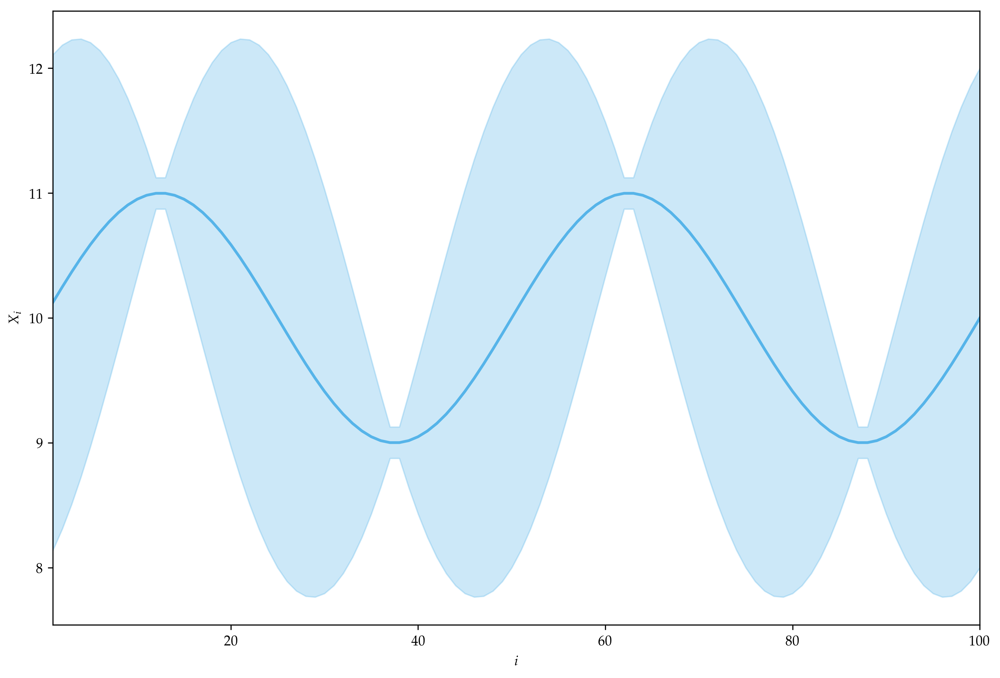

In [7]:
function plot_prior()
    cbbPalette = ["#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
    plt.fill_between(x=1:n, 
                     y1=μ_i+mean_m-2*sqrt.(σ_i), 
                     y2=μ_i+mean_m+2*sqrt.(σ_i), 
                     color=cbbPalette[2], alpha=0.3)
    plt.plot(1:n, μ_i+mean_m, color=cbbPalette[2], linewidth=2)
    plt.xlim(1,n)
    plt.xlabel(L"i")
    plt.ylabel(L"X_i")
    return
end
plot_prior()

In [8]:
Xi_rv  = [Normal(μ,σ) for (μ,σ) in zip(μ_i+mean_m, σ_i)]
# xi_obs = [rand(X) for X in Xi_rv]
# Xmax = maximum(xi_obs)
# Xmin = minimum(xi_obs)
Xmax = 2.5+mean_m
Xmin = -1.2+mean_m

8.8

# Analytical Posterior

In [9]:
@time begin
lfmin = [logpdf(X, Xmin) for X in Xi_rv]
lfMax = [logpdf(X, Xmax) for X in Xi_rv]
lFmin = [logcdf(X, Xmin) for X in Xi_rv]
lFMax = [logcdf(X, Xmax) for X in Xi_rv]
lFbetween = log.(expm1.(lFMax) .- expm1.(lFmin))

logPij = Array{Float64}(n,n)
for j in 1:n
    for i in 1:n
        if i==j
            logPij[i,j] = -Inf
            continue
        end
        
        lpij = lfmin[i] + lfMax[j]
        for k in 1:n
            if i==k
                continue
            elseif j==k
                continue
            end
            lpij += lFbetween[k]
        end
        logPij[i,j] = lpij
    end
end
logPij
Z = sum(exp.(logPij))
Z = sum(expm1.(logPij))+n^2
Pij = exp.(logPij - log(Z))
@assert sum(Pij) ≈ 1
end

  0.671575 seconds (3.22 M allocations: 73.532 MiB, 4.69% gc time)


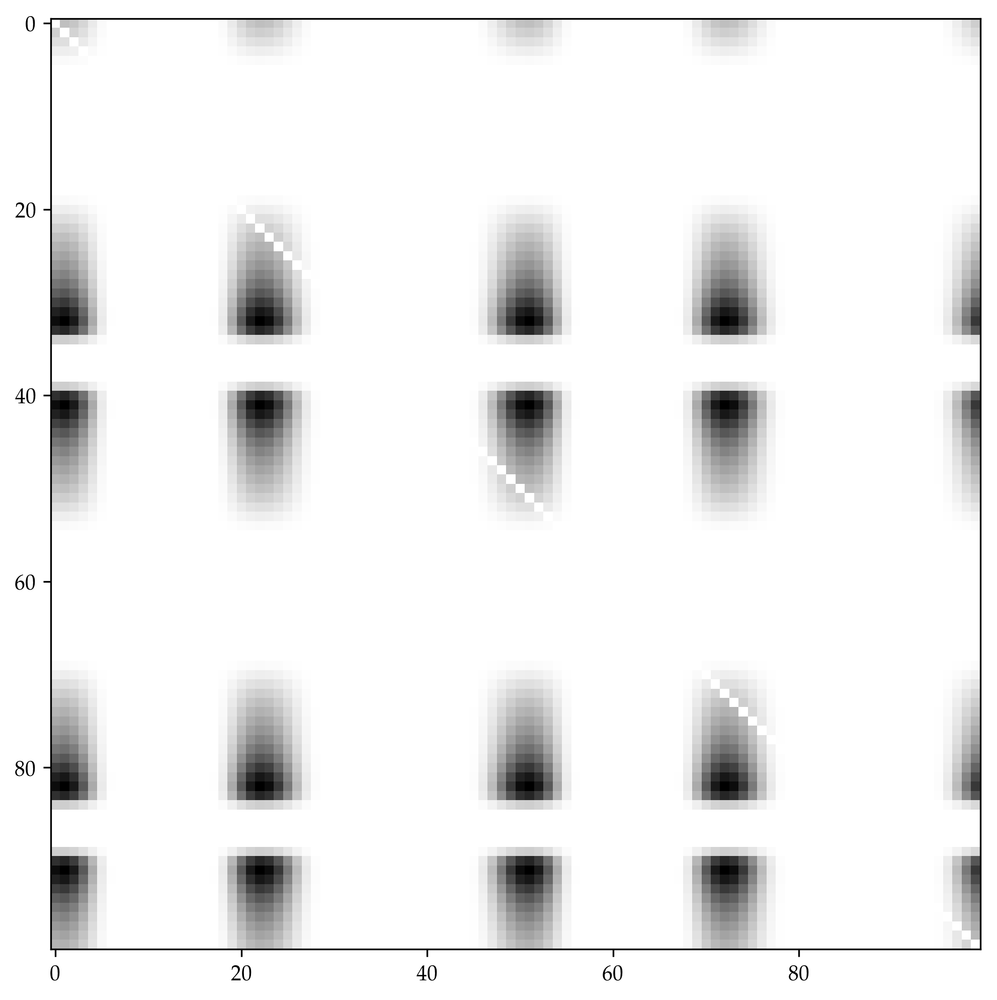

PyObject <matplotlib.image.AxesImage object at 0x13d2c1320>

In [10]:
plt.imshow(Pij, interpolation="nearest", vmin=0, cmap="gray_r")

In [11]:
P_j = vec(sum(Pij,1))
Pi_ = vec(sum(Pij,2))
;
# Pi_[i] is the probability that 
# the ith unit set the minimum

100-element Array{Float64,1}:
 0.00842092  
 0.00642839  
 0.00432736  
 0.00226588  
 0.000701904 
 6.74243e-5  
 3.71887e-7  
 6.5985e-13  
 5.70956e-31 
 1.31902e-111
 0.0         
 0.0         
 0.0         
 ⋮           
 2.46961e-9  
 0.00680724  
 0.0299077   
 0.0350711   
 0.0318726   
 0.0272809   
 0.023135    
 0.01971     
 0.0168768   
 0.014458    
 0.0123203   
 0.0103481   

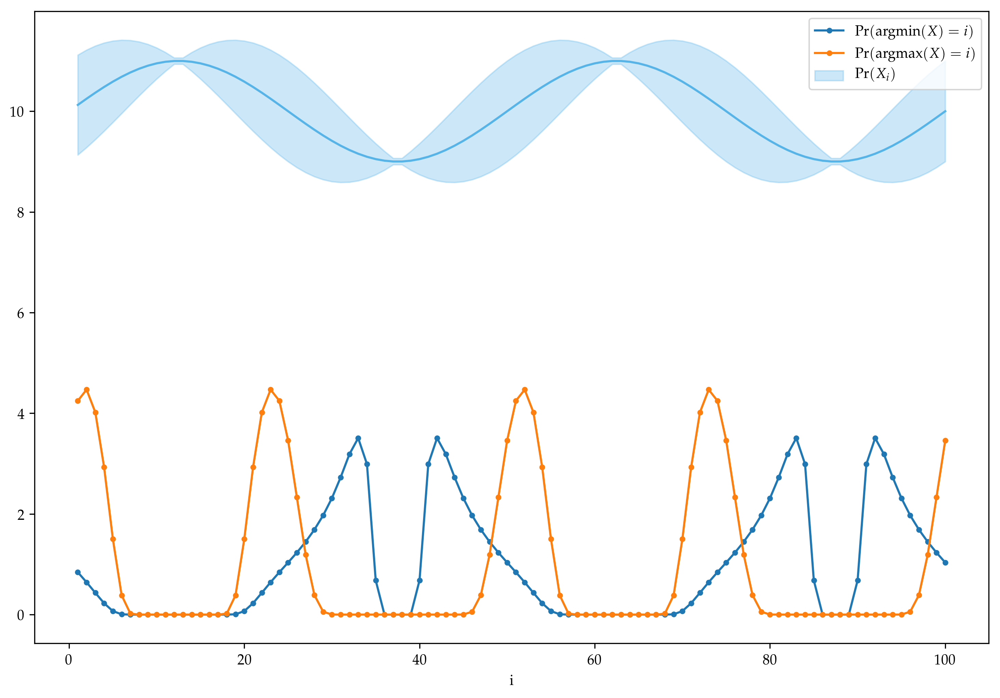

PyObject <matplotlib.legend.Legend object at 0x1190125c0>

In [12]:
plt.plot(1:n, Pi_.*100, "-", marker=".", label=L"$\Pr(\mathrm{argmin}(X)=i)$")
plt.plot(1:n, P_j.*100, "-", marker=".", label=L"$\Pr(\mathrm{argmax}(X)=i)$")
cbbPalette = ["#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
plt.fill_between(x=1:n, 
                 y1=μ_i+mean_m-sqrt.(σ_i), 
                 y2=μ_i+mean_m+sqrt.(σ_i), 
                 label=L"\Pr(X_i)",
                 color=cbbPalette[2], alpha=0.3)
plt.plot(1:n, μ_i+mean_m, color=cbbPalette[2])
plt.xlabel("i")
plt.legend(loc="best")

In [13]:
@time begin
n_xx = 10000
xx_cdf = linspace(Xmin, Xmax,n_xx)
Xiconditional_cdf = Vector{Vector{Float64}}(n)
for i in 1:n
    Xiconditional_cdf[i] = Pi_[i] + (1-Pi_[i]-P_j[i]) * (cdf.(Xi_rv[i],xx_cdf) .- cdf.(Xi_rv[i],Xmin)) ./ exp(lFbetween[i])
end
end

  0.571480 seconds (287.64 k allocations: 45.306 MiB, 5.99% gc time)


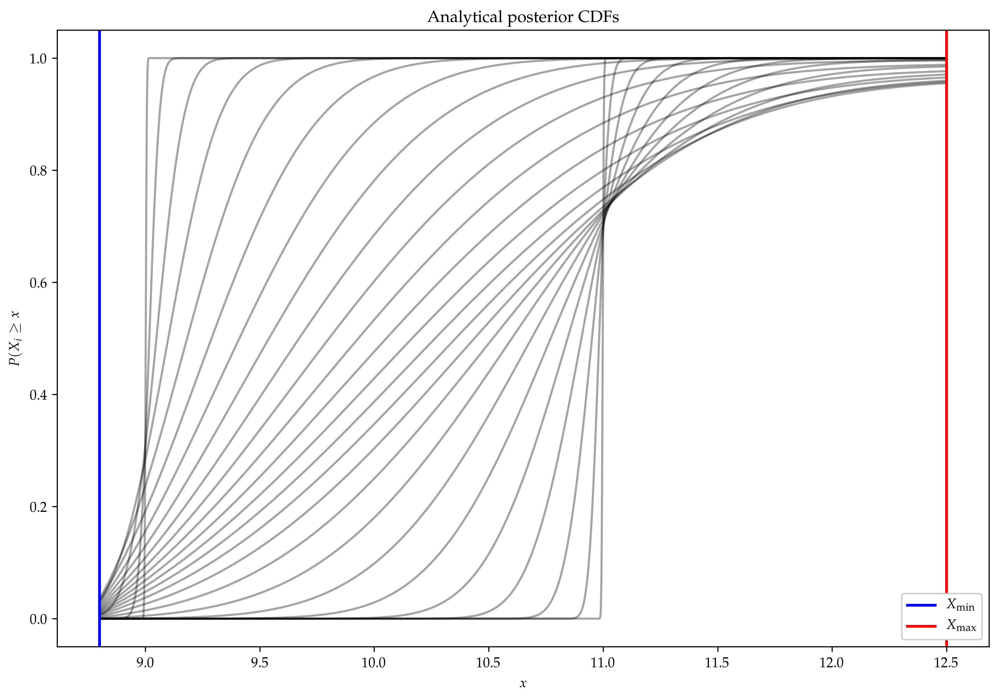

In [14]:
for i in 1:n
    plt.plot(xx_cdf, Xiconditional_cdf[i], color="black", alpha=0.1)
end
plt.axvline(x=Xmin, color="blue", label=L"$X_{\min}$", linewidth=2)
plt.axvline(x=Xmax, color="red", label=L"$X_{\max}$", linewidth=2)
plt.legend(loc="lower right", 
           framealpha=1.0)
plt.ylabel(L"$P(X_i \ge x$")
plt.xlabel(L"$x$")
plt.title("Analytical posterior CDFs")
;

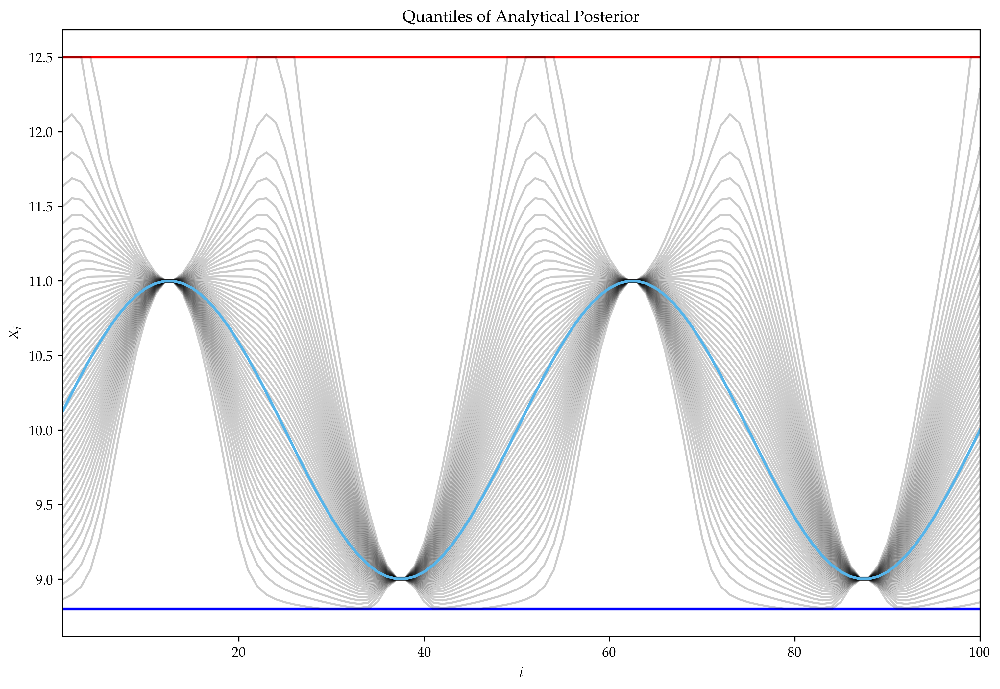

In [15]:
function plot_analy()
    plt.axhline(y=Xmin, color="blue", label=L"$X_{\min}$", linewidth=2)
    plt.axhline(y=Xmax, color="red", label=L"$X_{\max}$", linewidth=2)
    for quant in (0:0.02:1)[2:end-1]
        iquant = [searchsortedfirst(Xiconditional_cdf[i], quant)
                      for i in 1:n]
        analytic_q = xx_cdf[min.(iquant, n_xx)]
        plt.plot(1:n, analytic_q, color="black", alpha=0.2)
    end
    plt.plot(1:n, μ_i+mean_m, color=cbbPalette[2], linewidth=2)
    plt.ylabel(L"X_i")
    plt.xlabel(L"i")
    plt.xlim(1,n)
    plt.title("Quantiles of Analytical Posterior")
    return
end
plot_analy()

# Stan no-smooth

In [16]:
model_nosmooth = """
    data {
        int<lower=0> N; // number of observations
        real Xmax;
        real Xmin;
        vector[N] mu_i;
        real<lower=0> sigma_i[N];
    }
    parameters {
        vector[N] X_i; // latent variables
    }
    model {
        X_i ~ normal(mu_i, sigma_i);
        Xmax ~ normal(max(X_i), 0.01);
        Xmin ~ normal(min(X_i), 0.01);
    }
"""

data = Dict(
    "N" => n,
    "Xmax" => Xmax,
    "Xmin" => Xmin,
    "mu_i" => μ_i+mean_m,
    "sigma_i" => σ_i,
    "k" => 30,
    )

Dict{String,Any} with 6 entries:
  "sigma_i" => [0.984292, 0.938153, 0.864484, 0.767913, 0.654508, 0.531395, 0.4…
  "mu_i"    => [10.1253, 10.2487, 10.3681, 10.4818, 10.5878, 10.6845, 10.7705, …
  "N"       => 100
  "k"       => 30
  "Xmin"    => 8.8
  "Xmax"    => 12.5

In [17]:
@time stan_nosmooth = Stanmodel(
        name="nosmooth", 
        model=model_nosmooth, 
        num_warmup=1000,
        num_samples=10000,
        useMamba=false,
        nchains=4)
;

  0.296388 seconds (240.70 k allocations: 12.720 MiB, 3.21% gc time)


In [20]:
@time rc, sim_nosmooth = stan(
        stan_nosmooth, 
        [data], 
        CmdStanDir=Stan.CMDSTAN_HOME,
        summary=true)
;


make: `/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/nosmooth' is up to date.

Length of data array is not equal to nchains,
all chains will use the first data dictionary.

Calling /usr/local/Cellar/cmdstan/2.17.0/bin/stansummary to infer across chains.

Inference for Stan model: nosmooth_model
4 chains: each with iter=(10000,10000,10000,10000); warmup=(0,0,0,0); thin=(1,1,1,1); 40000 iterations saved.

Warmup took (3.3, 3.7, 5.0, 5.1) seconds, 17 seconds total
Sampling took (72, 72, 71, 70) seconds, 4.8 minutes total

                    Mean     MCSE   StdDev        5%       50%       95%  N_Eff  N_Eff/s    R_hat
lp__            -4.2e+05  2.5e+04  5.1e+04  -5.1e+05  -4.2e+05  -3.3e+05    4.2  1.5e-02  2.8e+00
accept_stat__    9.8e-01  2.7e-03  4.4e-02   9.3e-01   9.9e-01   1.0e+00    266  9.3e-01  1.0e+00
stepsize__       8.7e-05  1.0e-05  1.4e-05   6.6e-05   9.9e-05   1.0e-04    2.0  7.0e-03  1.1e+13
treedepth__      1.0e+01  5.2e-16  1.0e-13   1.0e+01   1.0

 85.150244 seconds (5.42 M allocations: 643.575 MiB, 0.35% gc time)


In [21]:
@assert rc==0 # rc is 0 if all is well

In [22]:
size(sim_nosmooth)

(10000, 107, 4)

In [23]:
sim_nosmooth

10000×107×4 Array{Float64,3}:
[:, :, 1] =
 -545162.0  0.966808  9.85149e-5  10.0  …  -0.288157  0.853746  0.579166
 -545094.0  0.924964  9.85149e-5  10.0     -0.288214  0.853858  0.579059
 -545050.0  0.749411  9.85149e-5  10.0     -0.288272  0.853973  0.578972
 -544972.0  0.965209  9.85149e-5  10.0     -0.28837   0.854082  0.579008
 -544779.0  1.0       9.85149e-5  10.0     -0.288625  0.853926  0.578855
 -544502.0  0.781193  9.85149e-5  10.0  …  -0.28826   0.854236  0.578947
 -544482.0  0.99904   9.85149e-5  10.0     -0.288265  0.85425   0.578993
 -544346.0  0.751445  9.85149e-5  10.0     -0.287997  0.854172  0.578953
 -544184.0  0.993567  9.85149e-5  10.0     -0.28798   0.854153  0.579418
 -544149.0  0.627029  9.85149e-5  10.0     -0.287894  0.854216  0.579289
 -544050.0  0.519029  9.85149e-5  10.0  …  -0.287775  0.854294  0.57913 
 -543735.0  0.992838  9.85149e-5  10.0     -0.288135  0.854418  0.579288
 -543535.0  0.743645  9.85149e-5  10.0     -0.287843  0.854359  0.57925 
       ⋮ 

In [66]:
function extract(chains::Array{Float64, 3}, n::Int)
#     X_varnames=[@sprintf("X_i.%d", i) for i in 1:n]
#     subset = chains[:, X_varnames, :]
    # this sucks
    numparams = size(chains, 2)
    return chains[:, 8:8+100-1, :]
end

extract (generic function with 1 method)

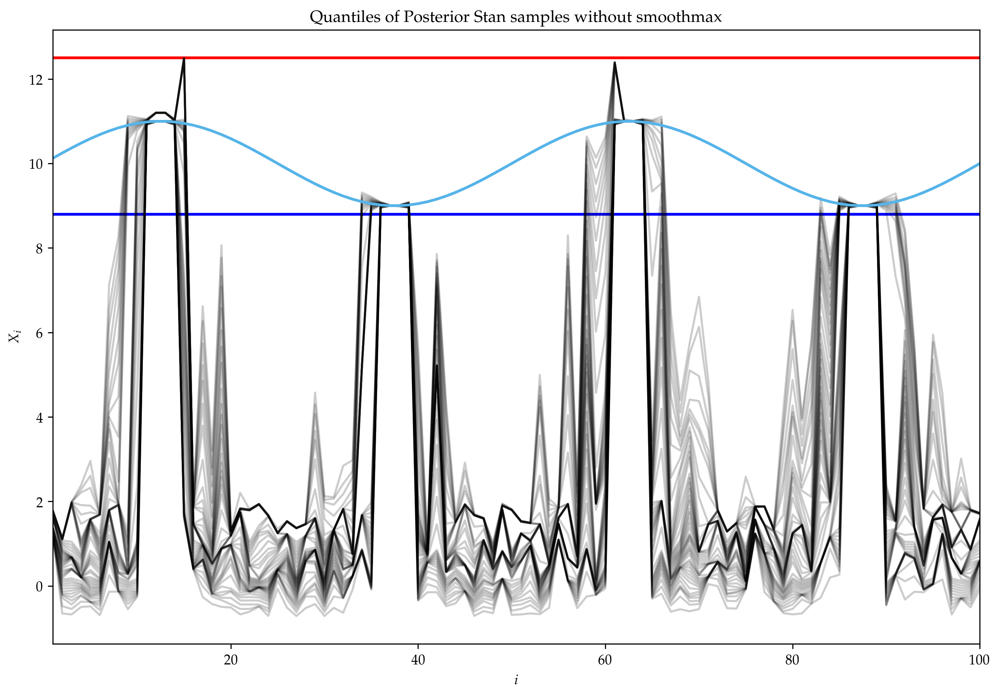

In [67]:
function plot_stan(sim)
    X_impt = extract(sim, n)
    X_stacked = vcat((X_impt[:,:,i] for i in 1:size(X_impt,3))...)
    sorted_impute = sort(X_stacked,1);
    plt.axhline(y=Xmin, color="blue", label=L"$X_{\min}$", linewidth=2)
    plt.axhline(y=Xmax, color="red", label=L"$X_{\max}$", linewidth=2)
    for quant in (0:0.02:1)[2:end-1]
        nsamples=size(sorted_impute,1)
        iquant = Int(round(quantile(1:nsamples, quant)))
        imputed_q = sorted_impute[iquant, :]
        plt.plot(1:n, vec(imputed_q), color="black", alpha=0.2)
    end
    plt.plot(1:n, μ_i+mean_m, color=cbbPalette[2], linewidth=2)
    plt.ylabel(L"X_i")
    plt.xlabel(L"i")
    plt.xlim(1,n)
    plt.title("Quantiles of Posterior Stan samples")
    return
end
plot_stan(sim_nosmooth)
plt.title("Quantiles of Posterior Stan samples without smoothmax")
;

# Stan no-smooth with mean parameter

In [31]:
model_nosmooth_mean = """
    data {
        int<lower=0> N; // number of observations
        real Xmax;
        real Xmin;
        vector[N] mu_i;
        real<lower=0> sigma_i[N];
    }
    parameters {
        vector[N] X_i; // latent variables
        real m;
    }
    model {
        m ~ normal(0, 5);
        X_i ~ normal(m + mu_i, sigma_i);
        Xmax ~ normal(max(X_i), 0.01);
        Xmin ~ normal(min(X_i), 0.01);
    }
"""
data_mean = Dict(
    "N" => n,
    "Xmax" => Xmax,
    "Xmin" => Xmin,
    "mu_i" => μ_i,
    "sigma_i" => σ_i,
    "k" => 30,
    )
;

In [33]:
@time stan_nosmooth_mean = Stanmodel(
        name="nosmooth_mean", 
        model=model_nosmooth_mean, 
        num_warmup=1000,
        num_samples=1000,
        useMamba=false,
        nchains=4)
;

  0.000274 seconds (232 allocations: 16.766 KiB)


In [34]:
@time rc, sim_nosmooth_mean = stan(
        stan_nosmooth_mean, 
        [data_mean], 
        CmdStanDir=Stan.CMDSTAN_HOME, 
        summary=true)
;



--- Translating Stan model to C++ code ---
bin/stanc  /Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/nosmooth_mean.stan --o=/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/nosmooth_mean.hpp
Model name=nosmooth_mean_model
Input file=/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/nosmooth_mean.stan
Output file=/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/nosmooth_mean.hpp

--- Linking C++ model ---
clang++ -Wall -I . -isystem stan/lib/stan_math/lib/eigen_3.3.3 -isystem stan/lib/stan_math/lib/boost_1.64.0 -isystem stan/lib/stan_math/lib/cvodes_2.9.0/include -std=c++1y -DBOOST_RESULT_OF_USE_TR1 -DBOOST_NO_DECLTYPE -DBOOST_DISABLE_ASSERTS -DBOOST_PHOENIX_NO_VARIADIC_EXPRESSION -I src -I stan/src -isystem stan/lib/stan_math/ -DEIGEN_NO_DEBUG -DFUSION_MAX_VECTOR_SIZE=12 -stdlib=libc++ -Wno-unknown-warning-option -Wno-unused-function -Wno-tautological-compare -Wsign-compare -DNO_FPRINTF_OUTPUT -pipe 

 43.970291 seconds (540.56 k allocations: 66.355 MiB, 0.09% gc time)


In [35]:
@assert rc==0 # rc is 0 if all is well

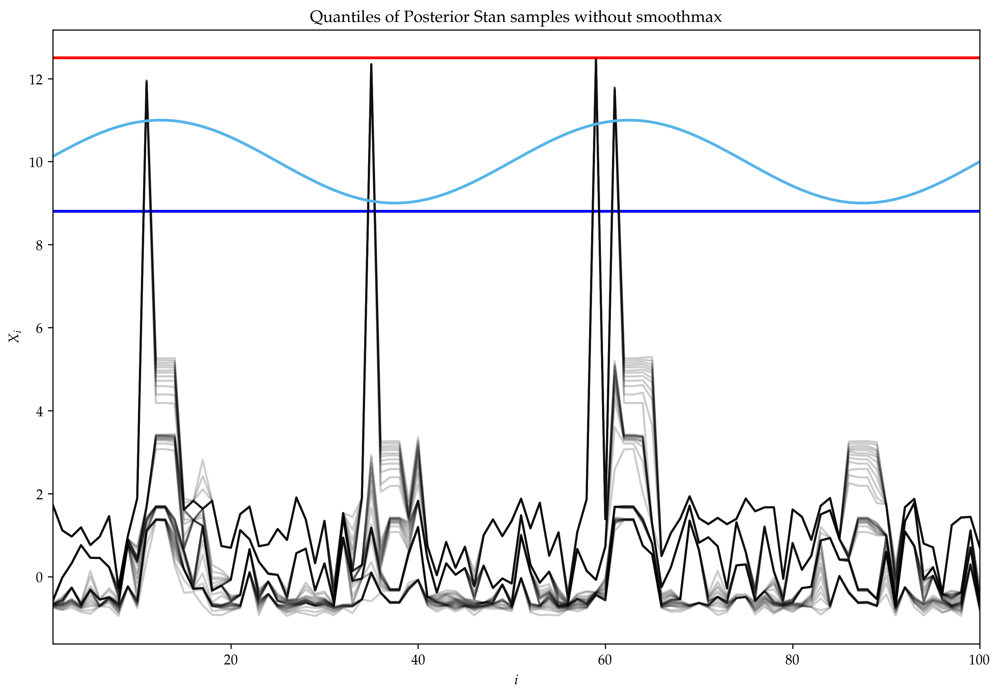

PyObject Text(0.5,1,'Quantiles of Posterior Stan samples without smoothmax')

In [68]:
plot_stan(sim_nosmooth_mean)
plt.title("Quantiles of Posterior Stan samples without smoothmax")

# Stan with smoothmax

In [37]:
model_imput = """
    functions {
        real smoothmax(vector x, real k, real maxkx){
            return (maxkx+log(sum(exp(k*x - maxkx))))/k;
        }
        real smoothmin(vector x, real k, real minkx){
            return -smoothmax(-x, k, -minkx);
        }
    }
    data {
        int<lower=0> N; // number of observations
        real Xmax;
        real Xmin;
        real mu_i[N];
        real<lower=0> sigma_i[N];
        real<lower=0> k;
    }
    parameters {
        vector[N] X_i; // latent variables
    }
    transformed parameters {
        real Xsmoothmax;
        real Xsmoothmin;
        Xsmoothmax = smoothmax(X_i, k, k*Xmax);
        Xsmoothmin = smoothmin(X_i, k, k*Xmin);
    }
    model {
        X_i ~ normal(mu_i, sigma_i);
        Xmax ~ normal(Xsmoothmax, 0.01);
        Xmin ~ normal(Xsmoothmin, 0.01);
    }
"""

@time stan_model = Stanmodel(
        name="smoothmax", 
        model=model_imput, 
        num_warmup=1000,
        num_samples=10000,
        useMamba=false,
        nchains=4)
;


File /Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.stan will be updated.

  0.000889 seconds (322 allocations: 19.625 KiB)


In [38]:
Stan.cmdline(stan_model)

`./smoothmax sample num_samples=10000 num_warmup=1000 save_warmup=0 thin=1 adapt engaged=1 gamma=0.05 delta=0.8 kappa=0.75 t0=10.0 init_buffer=75 term_buffer=50 window=25 algorithm=hmc engine=nuts max_depth=10 metric=diag_e stepsize=1.0 stepsize_jitter=1.0 random seed=-1 output refresh=100`

In [39]:
@time rc, sim = stan(
        stan_model, 
        [data], 
        CmdStanDir=Stan.CMDSTAN_HOME, 
        summary=true)
;



--- Translating Stan model to C++ code ---
bin/stanc  /Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.stan --o=/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.hpp
Model name=smoothmax_model
Input file=/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.stan
Output file=/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.hpp

--- Linking C++ model ---
clang++ -Wall -I . -isystem stan/lib/stan_math/lib/eigen_3.3.3 -isystem stan/lib/stan_math/lib/boost_1.64.0 -isystem stan/lib/stan_math/lib/cvodes_2.9.0/include -std=c++1y -DBOOST_RESULT_OF_USE_TR1 -DBOOST_NO_DECLTYPE -DBOOST_DISABLE_ASSERTS -DBOOST_PHOENIX_NO_VARIADIC_EXPRESSION -I src -I stan/src -isystem stan/lib/stan_math/ -DEIGEN_NO_DEBUG -DFUSION_MAX_VECTOR_SIZE=12 -stdlib=libc++ -Wno-unknown-warning-option -Wno-unused-function -Wno-tautological-compare -Wsign-compare -DNO_FPRINTF_OUTPUT -pipe   -O3 -o /Users/imol

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite!  (in '/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.stan' at line 28)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite!  (in '/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.stan' at line 28)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model m

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite!  (in '/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.stan' at line 28)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite!  (in '/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.stan' at line 28)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model m


Calling /usr/local/Cellar/cmdstan/2.17.0/bin/stansummary to infer across chains.

Inference for Stan model: smoothmax_model
4 chains: each with iter=(10000,10000,10000,10000); warmup=(0,0,0,0); thin=(1,1,1,1); 40000 iterations saved.

Warmup took (5.0, 4.7, 5.2, 4.7) seconds, 20 seconds total
Sampling took (64, 65, 79, 52) seconds, 4.4 minutes total

                 Mean     MCSE   StdDev     5%    50%    95%  N_Eff  N_Eff/s    R_hat
lp__              -47  4.4e-02  6.2e+00    -57    -46    -37  20317  7.8e+01  1.0e+00
accept_stat__    0.94  4.1e-04  8.1e-02   0.77   0.97   1.00  40000  1.5e+02  1.0e+00
stepsize__      0.011  2.9e-04  4.1e-04  0.011  0.012  0.012    2.0  7.7e-03  2.8e+12
treedepth__       8.3  1.9e-01  4.6e-01    8.0    8.0    9.0    5.5  2.1e-02  1.2e+00
n_leapfrog__      373  4.8e+01  1.3e+02    255    255    511    7.1  2.7e-02  1.2e+00
divergent__      0.00  0.0e+00  0.0e+00   0.00   0.00   0.00  40000  1.5e+02      nan
energy__           97  7.1e-02  9.4e+00     

118.754857 seconds (5.40 M allocations: 622.688 MiB, 0.12% gc time)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite!  (in '/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.stan' at line 28)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite!  (in '/Users/imolk/Documents/Harvard/Natesh/temperature_model/notebooks/tmp/smoothmax.stan' at line 28)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model m

In [40]:
@assert rc==0 # rc is 0 if all is well

In [30]:
describe(sim)

Iterations = 1:10000
Thinning interval = 1
Chains = 1,2,3,4
Samples per chain = 10000

Empirical Posterior Estimates:
                   Mean           SD          Naive SE          MCSE          ESS    
         lp__ -46.609769065   6.2535808024 0.031267904012 0.0454151478302 10000.00000
accept_stat__   0.926711304   0.0986286807 0.000493143403 0.0009089977382 10000.00000
   stepsize__   0.012212875   0.0010787502 0.000005393751 0.0000540043829   399.00998
  treedepth__   8.226325000   0.4184571329 0.002092285664 0.0128930674748  1053.39060
 n_leapfrog__ 335.339200000 118.8800330372 0.594400165186 4.2238710818027   792.13012
  divergent__   0.000000000   0.0000000000 0.000000000000 0.0000000000000         NaN
     energy__  96.624814660   9.4639255867 0.047319627933 0.0741250493585 10000.00000
        X_i.1  10.359571268   0.9129817351 0.004564908675 0.0065245227409 10000.00000
        X_i.2  10.434769027   0.9032039320 0.004516019660 0.0064787384749 10000.00000
        X_i.3  10.4936

        X_i.2   8.95223925   9.752987500  10.3488000  11.00420000  12.4974000
        X_i.3   9.00995150   9.864250000  10.4386000  11.04440000  12.4935000
        X_i.4   9.12016700  10.001175000  10.5159000  11.05035000  12.4886000
        X_i.5   9.33912900  10.164075000  10.6069500  11.06010000  12.0549000
        X_i.6   9.65086625  10.328400000  10.6908000  11.05010000  11.7491000
        X_i.7   9.98408525  10.498600000  10.7717000  11.04262500  11.5681050
        X_i.8  10.28049500  10.650300000  10.8431000  11.03832500  11.4037000
        X_i.9  10.55009500  10.782800000  10.9048000  11.02570000  11.2574050
       X_i.10  10.76389500  10.885700000  10.9508000  11.01680000  11.1386000
       X_i.11  10.91310000  10.958300000  10.9822000  11.00630000  11.0513000
       X_i.12  10.99020000  10.995300000  10.9980000  11.00070000  11.0058000
       X_i.13  10.99020000  10.995400000  10.9981000  11.00070000  11.0057000
       X_i.14  10.91320000  10.958700000  10.9824000  11.0059000

In [79]:
X_impt = extract(sim, n)
X_stacked = vcat((X_impt[:,:,i] for i in 1:size(X_impt,3))...)
sorted_impute = sort(X_stacked,1);
size(X_stacked)

(40000, 100)

In [81]:
@assert size(X_stacked, 2) == 100

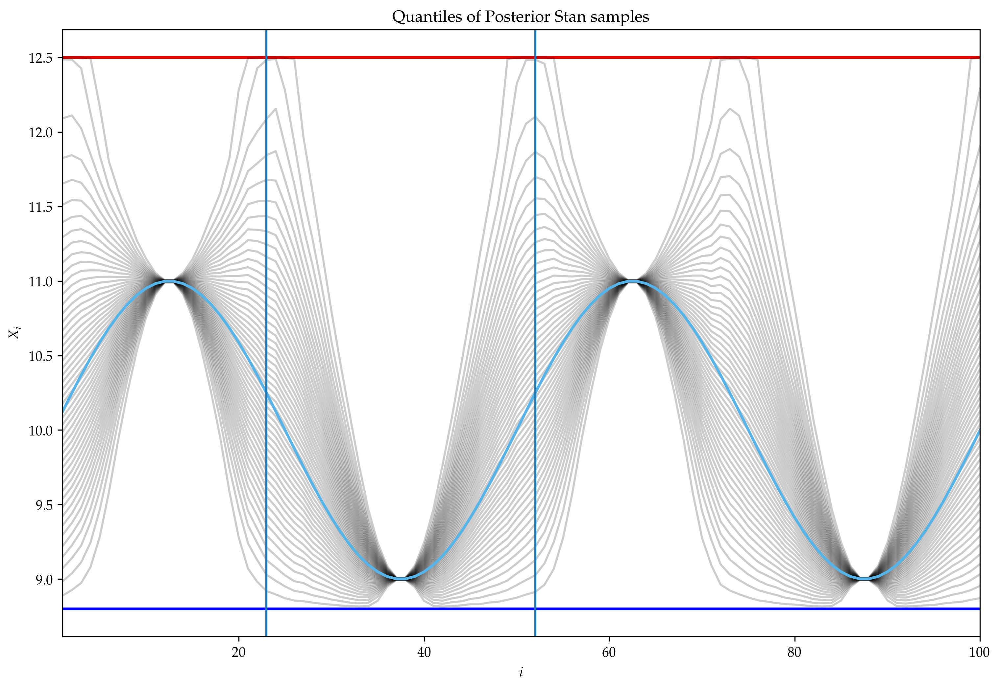

PyObject <matplotlib.lines.Line2D object at 0x1400d26a0>

In [82]:
plot_stan(sim)
plt.axvline(23)
plt.axvline(52)

# Joint Posterior

In [83]:
size(X_stacked)

(40000, 100)

## Scatter

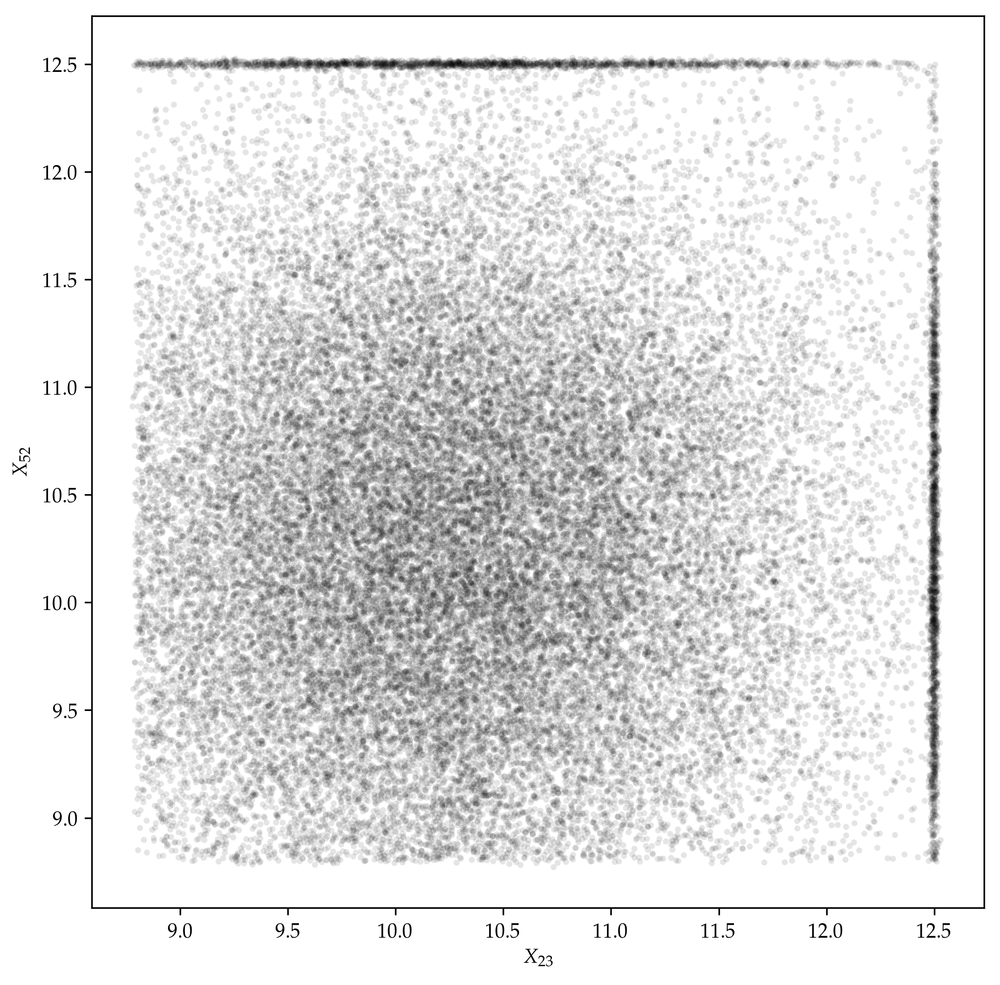

In [84]:
function plot_scatter()
    i = 23
    j = 52
    plt.scatter(X_stacked[:,i], X_stacked[:,j], 
                marker=".", edgecolors="none", color="black", alpha=0.1)
    plt.xlabel(L"$X_{23}$")
    plt.ylabel(L"$X_{52}$")
    plt.axis("square")
end
plot_scatter();

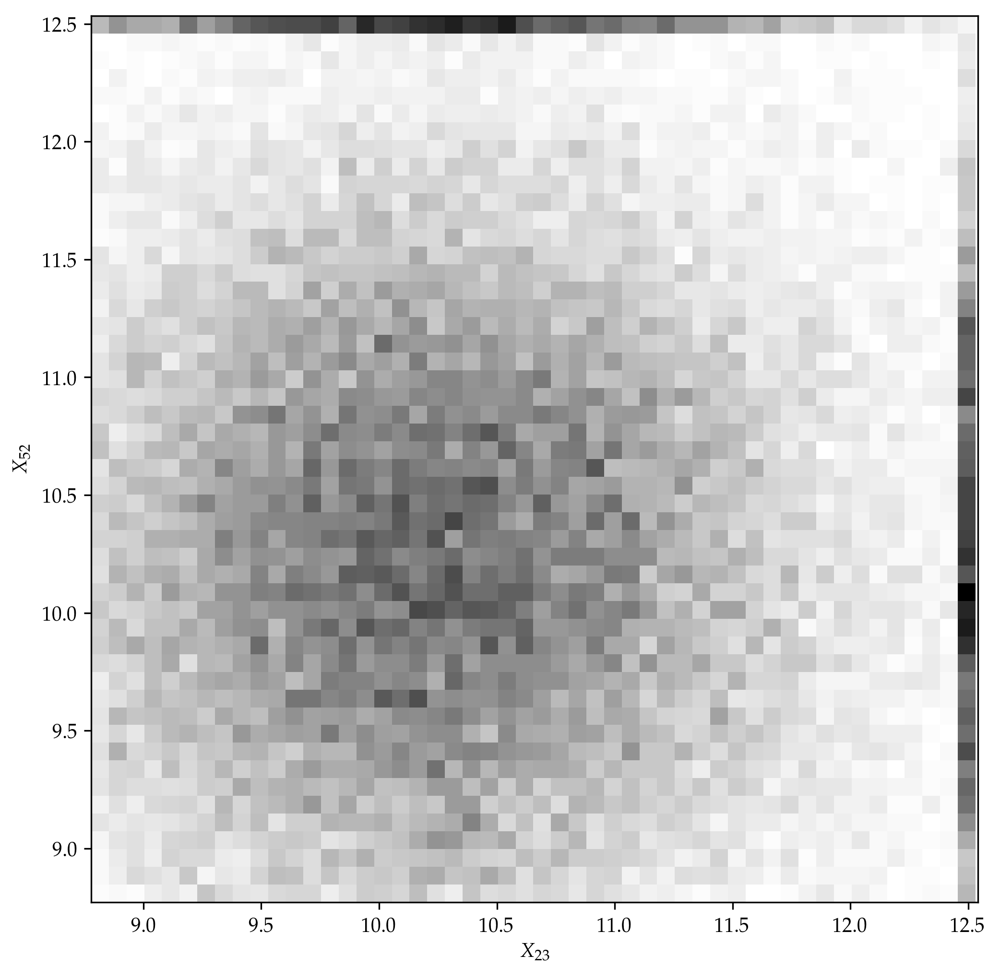

(8.77942, 12.54209, 8.77103, 12.5337)

In [85]:
i = 23
j = 52
plt.hist2D(X_stacked[:,i], X_stacked[:,j], bins=50, cmap="gray_r")
plt.xlabel(L"$X_{23}$")
plt.ylabel(L"$X_{52}$")
plt.axis("square")

## CDF

In [86]:
n_grid = 100

function fracbelow(X_stacked, n_grid, i, j)
    X_i_samples = X_stacked[:,i]
    X_j_samples = X_stacked[:,j]
    xx_grid = linspace(Xmin-0.1, Xmax+0.1, n_grid)
    xy_sumbelow = zeros(Int, n_grid, n_grid)
    n_samples = size(X_stacked, 1)
    for jg in 1:n_grid
        for ig in 1:n_grid
            for k in 1:n_samples
                xy_sumbelow[ig,jg] += (
                      (X_i_samples[k] <= xx_grid[ig])
                    & (X_j_samples[k] <= xx_grid[jg])
                    ) ? 1 : 0
            end
        end
    end
    return xy_sumbelow ./ n_samples
end
xy_fracbelow = fracbelow(X_stacked, 100, 23, 52)

100×100 Array{Float64,2}:
 0.0  0.0  0.0     0.0       0.0       …  0.0       0.0       0.0     
 0.0  0.0  0.0     0.0       0.0          0.0       0.0       0.0     
 0.0  0.0  0.0     0.0       0.0          0.0       0.0       0.0     
 0.0  0.0  0.0     0.0       2.5e-5       0.00365   0.00365   0.00365 
 0.0  0.0  0.0     0.0       5.0e-5       0.009575  0.009575  0.009575
 0.0  0.0  0.0     0.0       5.0e-5    …  0.01585   0.01585   0.01585 
 0.0  0.0  0.0     0.0       0.0001       0.022675  0.022675  0.022675
 0.0  0.0  0.0     0.0       0.000125     0.0298    0.0298    0.0298  
 0.0  0.0  0.0     5.0e-5    0.000225     0.037275  0.037275  0.037275
 0.0  0.0  0.0     5.0e-5    0.0003       0.044375  0.044375  0.044375
 0.0  0.0  0.0     0.0001    0.000425  …  0.0527    0.0527    0.0527  
 0.0  0.0  0.0     0.000125  0.000575     0.061525  0.061525  0.061525
 0.0  0.0  0.0     0.000125  0.0007       0.070225  0.070225  0.070225
 ⋮                                     ⋱           

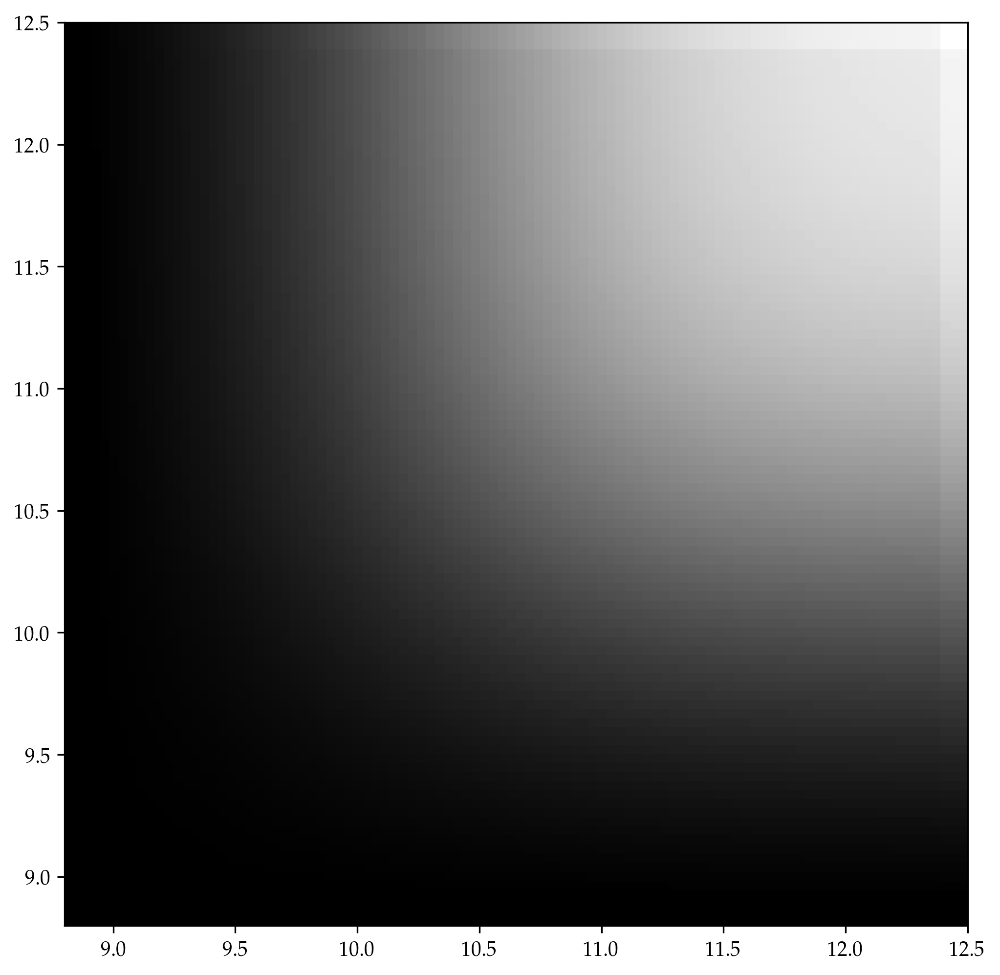

In [87]:
plt.imshow(
        xy_fracbelow, 
        interpolation="nearest", 
        cmap="gray", 
        vmin=0, vmax=1, 
        origin="lower",
        extent=(Xmin, Xmax, Xmin, Xmax),
        )
;

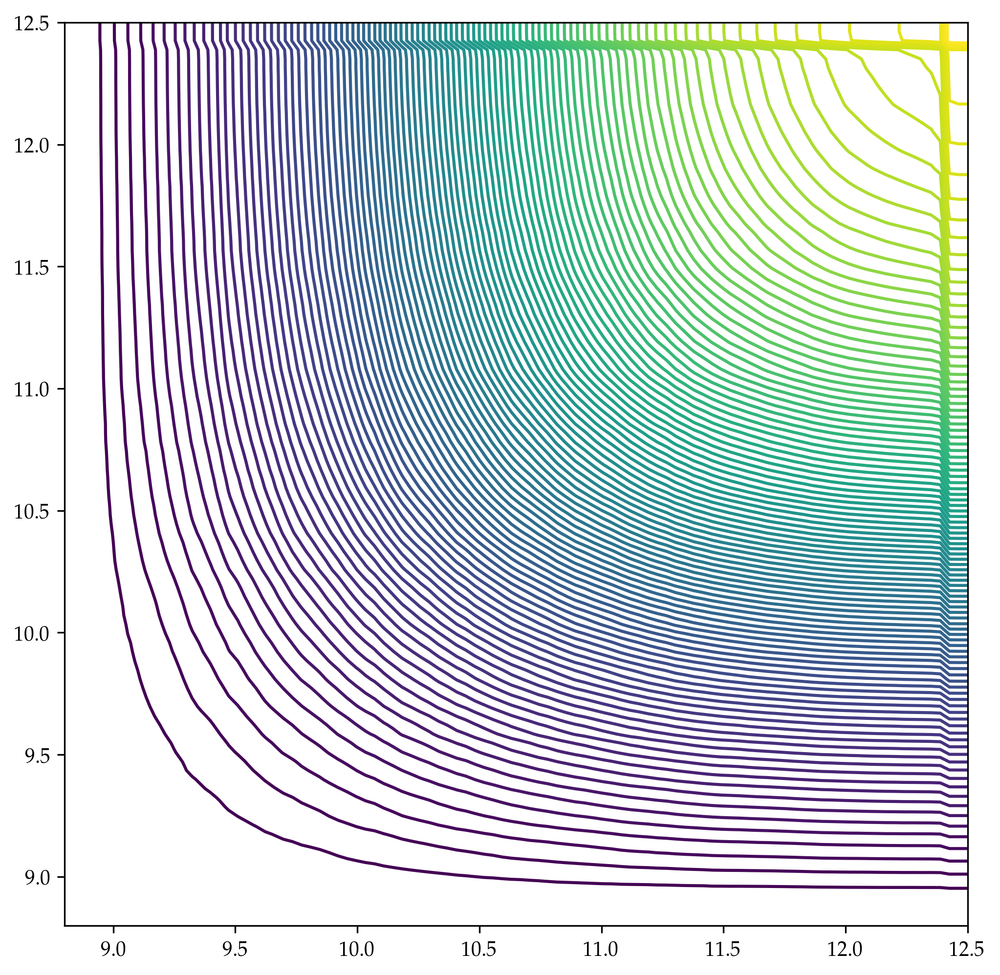

In [88]:
n_grid = 100
xx_grid = collect(linspace(Xmin, Xmax, n_grid))
plt.contour(xx_grid, xx_grid, xy_fracbelow,
            collect(linspace(0,1,100))
            )
plt.axis("square")
;

## Contour

In [89]:
function find_min_max(X_stacked)
    n_samples = size(X_stacked, 1)
    sample_min = [findmin(X_stacked[k,:])[2] for k in 1:n_samples]
    sample_max = [findmax(X_stacked[k,:])[2] for k in 1:n_samples]
    return sample_min, sample_max
end

function extract_middle(X_stacked, i, j, Xmin, Xmax)
    sample_min, sample_max = find_min_max(X_stacked)
    i_is_min = sample_min .== i
    j_is_min = sample_min .== j
    i_is_max = sample_max .== i
    j_is_max = sample_max .== j
    return X_stacked[(.!i_is_min) .& (.!j_is_min) .& (.!i_is_max) .& (.!j_is_max),
                     [i, j]]
end
println(size(X_stacked))
i = 23
j = 52
X_middle = extract_middle(X_stacked, i, j, Xmin, Xmax)
println(size(X_middle))
prop_middle = size(X_middle, 1) / size(X_stacked, 1)

(40000, 100)
(36078, 2)


0.90195

### KDE

In [90]:
bandwidth=0.2
kde_ij = kde((X_middle[:,1], X_middle[:,2]);
             kernel=(Normal, Normal),
             bandwidth=(bandwidth, bandwidth),
             )

bounded_density = copy(kde_ij.density)
margin=0
for (i,x) in enumerate(kde_ij.x)
    x_kern = Normal(x, bandwidth)
    p_within_x = cdf(x_kern, Xmax-margin) - cdf(x_kern,Xmin+margin)
    for (j,y) in enumerate(kde_ij.y)
        y_kern = Normal(y, bandwidth)
        p_within_y = cdf(y_kern, Xmax-margin) - cdf(y_kern,Xmin+margin)
        p_within = p_within_x * p_within_y
        bounded_density[i,j] /= p_within
    end
end
kde_ij.density = bounded_density
;

In [91]:
n_cntr = 256
xx_cntr = collect(linspace(Xmin, Xmax, n_cntr))
kde_pdf_grid = Array{Float64}(n_cntr, n_cntr)
ik = InterpKDE(kde_ij)
for j in 1:n_cntr
    for i in 1:n_cntr
        kde_pdf_grid[i,j] = pdf(ik, xx_cntr[i], xx_cntr[j])
    end
end
kde_pdf_grid .*= prop_middle
;

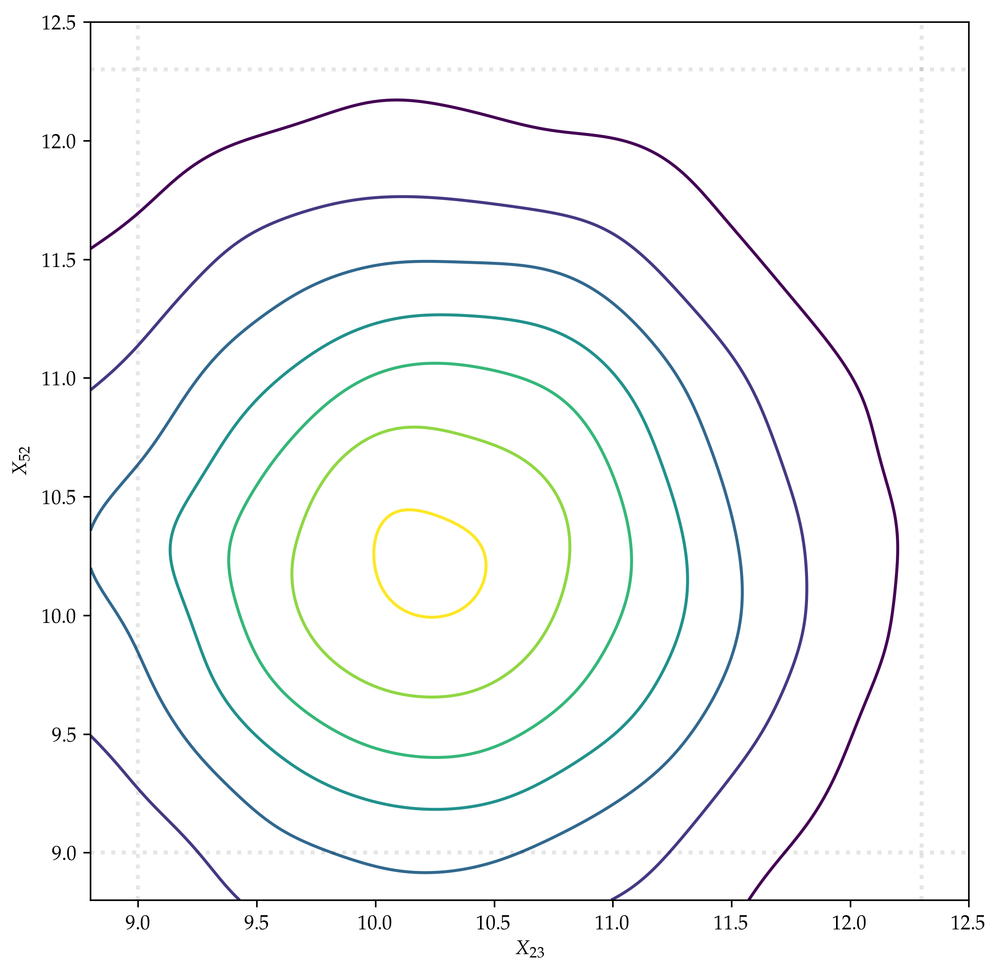

In [92]:
plt.contour(xx_cntr, xx_cntr, kde_pdf_grid)
plt.axis("square")
plt.xlabel(L"$X_{23}$")
plt.ylabel(L"$X_{52}$")
plt.axvline(Xmin+margin+bandwidth, color="black", 
            linestyle=":", linewidth=2, alpha=0.1)
plt.axhline(Xmin+margin+bandwidth, color="black", 
            linestyle=":", linewidth=2, alpha=0.1)
plt.axvline(Xmax-margin-bandwidth, color="black", 
            linestyle=":", linewidth=2, alpha=0.1)
plt.axhline(Xmax-margin-bandwidth, color="black", 
            linestyle=":", linewidth=2, alpha=0.1)
;

### Analytical

In [93]:
i = 23
j = 52
weight_middle = 1 - (Pi_[i] + Pi_[j] + P_j[i] + P_j[j]) + (Pij[i,j] + Pij[j,i])

0.8983507300193352

In [94]:
i = 23
j = 52
trunc_i = Distributions.TruncatedNormal(μ_i[i]+mean_m, σ_i[i], Xmin, Xmax)
trunc_j = Distributions.TruncatedNormal(μ_i[j]+mean_m, σ_i[j], Xmin, Xmax)

anal_pdf_grid = Array{Float64}(n_cntr, n_cntr)
for j in 1:n_cntr
    for i in 1:n_cntr
        anal_pdf_grid[i,j] = pdf(trunc_i, xx_cntr[i]) * pdf(trunc_j, xx_cntr[j])
    end
end
anal_pdf_grid .*= weight_middle
;

### Overplot

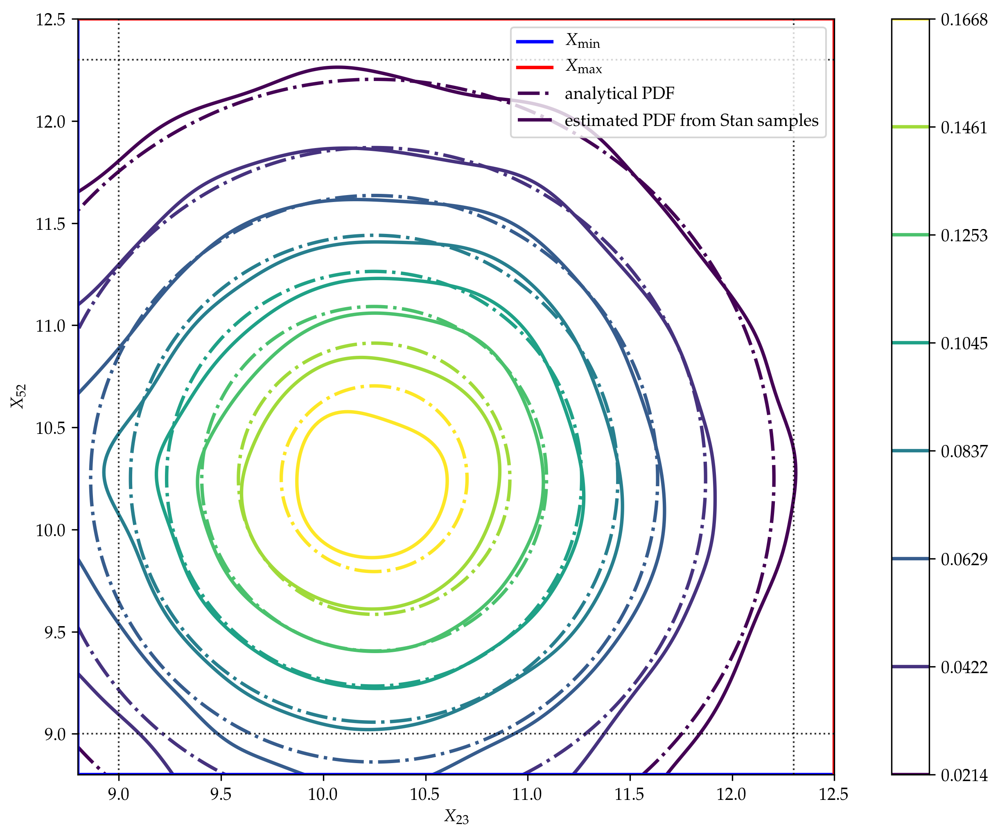

In [95]:
function plot_contours(;plot_minmax=true, plot_kdelim=true)
    pdf_min = min(minimum(anal_pdf_grid), minimum(kde_pdf_grid))
    pdf_max = max(maximum(anal_pdf_grid), maximum(kde_pdf_grid))
    pdf_V = linspace(pdf_min, pdf_max, 10)
    cbbPalette = ["#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
    ct = plt.contour(xx_cntr, xx_cntr, anal_pdf_grid, pdf_V, 
#                 colors=cbbPalette[7],
                cmap="viridis",
                linewidths=2,
                linestyles="dashdot",
                )
    ct[:collections][1][:set_label]("analytical PDF")
    ct = plt.contour(xx_cntr, xx_cntr, kde_pdf_grid, pdf_V, 
#                 colors=cbbPalette[5],
                cmap="viridis",
                linewidths=2,
                )
    ct[:collections][1][:set_label]("estimated PDF from Stan samples")
    plt.axis("square")
    plt.xlabel(L"$X_{23}$")
    plt.ylabel(L"$X_{52}$")
    if plot_minmax
        plt.axhline(y=Xmin, color="blue", label=L"$X_{\min}$", linewidth=2)
        plt.axvline(x=Xmin, color="blue", linewidth=2)
        plt.axhline(y=Xmax, color="red", label=L"$X_{\max}$", linewidth=2)
        plt.axvline(x=Xmax, color="red", linewidth=2)
    end
    
    if plot_kdelim
        plt.axvline(Xmin+margin+bandwidth, color="black", 
                    linestyle=":", linewidth=1, alpha=0.8)
        plt.axhline(Xmin+margin+bandwidth, color="black", 
                    linestyle=":", linewidth=1, alpha=0.8)
        plt.axvline(Xmax-margin-bandwidth, color="black", 
                    linestyle=":", linewidth=1, alpha=0.8)
        plt.axhline(Xmax-margin-bandwidth, color="black", 
                    linestyle=":", linewidth=1, alpha=0.8)
    end
    return plt.gca()
end
plot_contours()
plt.legend(loc="upper right")
plt.colorbar()
;

## bottom margin

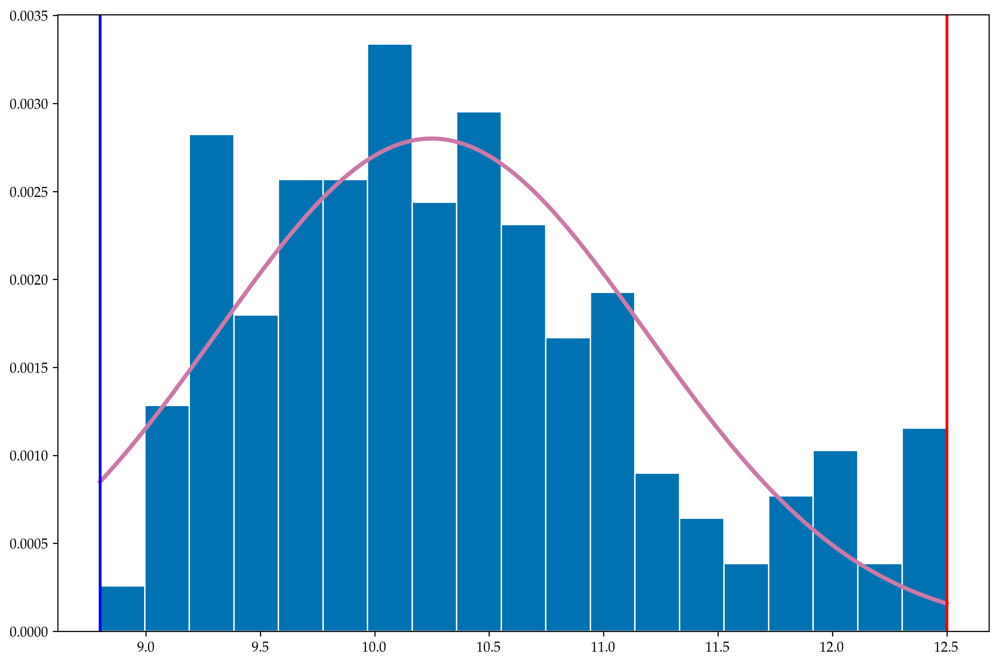

In [96]:
function plot_bottom()
    i = 23
    j = 52
    sample_min, sample_max = find_min_max(X_stacked)
    bottom_j = sample_min .== j
    n_bottom_j = sum(bottom_j)
    n_samples = size(X_stacked, 1)
    bins = linspace(Xmin,Xmax,20)
    dx = median(diff(bins))
    plt.plt[:hist](X_stacked[bottom_j, i],
                   weights=ones(n_bottom_j)./n_samples./dx,
                   color=cbbPalette[5],
                   edgecolor="white",
                   bins=bins)
    anal_bottom_pdf = TruncatedNormal(μ_i[i]+mean_m, σ_i[i], Xmin, Xmax)
    n_hist = 1000
    xx = linspace(Xmin, Xmax, n_hist)
    plt.plot(xx, 
             (Pi_[j]-Pij[j,i]).*pdf.(anal_bottom_pdf, xx), 
             linewidth=3, 
             color=cbbPalette[7])
    plt.axvline(x=Xmin, color="blue", linewidth=2)
    plt.axvline(x=Xmax, color="red", linewidth=2)
end
plot_bottom()
;

## left margin

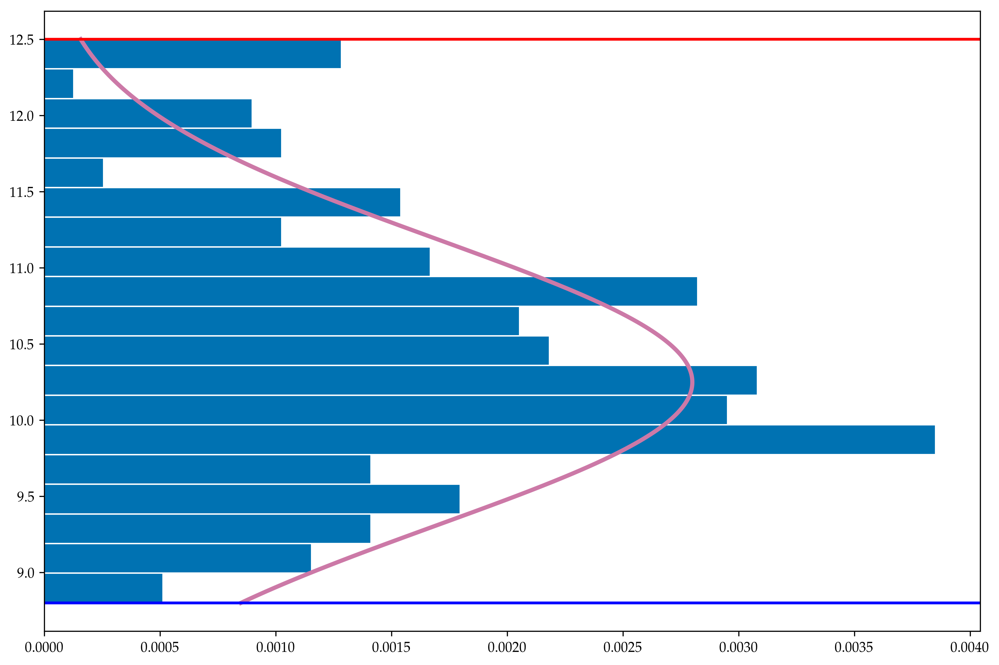

PyObject <matplotlib.lines.Line2D object at 0x1480a6e80>

In [97]:
function plot_left(;orientation="vertical")
    i = 23
    j = 52
    sample_min, sample_max = find_min_max(X_stacked)
    i_is_min = sample_min .== i
    n_min_i = sum(i_is_min)
    n_samples = size(X_stacked, 1)
    bins = linspace(Xmin,Xmax,20)
    dx = median(diff(bins))
    plt.plt[:hist](X_stacked[i_is_min, j],
                   weights=ones(n_min_i)./n_samples./dx,
                   color=cbbPalette[5],
                   edgecolor="white",
                   orientation=orientation,
                   bins=bins)
    anal_left_pdf = TruncatedNormal(μ_i[j]+mean_m, σ_i[j], Xmin, Xmax)
    n_hist = 1000
    xx = linspace(Xmin, Xmax, n_hist)

    if orientation=="vertical"
        plt.plot(xx, 
                 (Pi_[i]-Pij[i,j]).*pdf.(anal_left_pdf, xx), 
                 linewidth=3, 
                 color=cbbPalette[7])
        plt.axvline(x=Xmin, color="blue", linewidth=2)
        plt.axvline(x=Xmax, color="red", linewidth=2)
    elseif orientation=="horizontal"
        plt.plot((Pi_[i]-Pij[i,j]).*pdf.(anal_left_pdf, xx), 
                 xx,
                 linewidth=3, 
                 color=cbbPalette[7])
        plt.axhline(y=Xmin, color="blue", linewidth=2)
        plt.axhline(y=Xmax, color="red", linewidth=2)
    end
end
plot_left(;orientation="horizontal")

## top margin

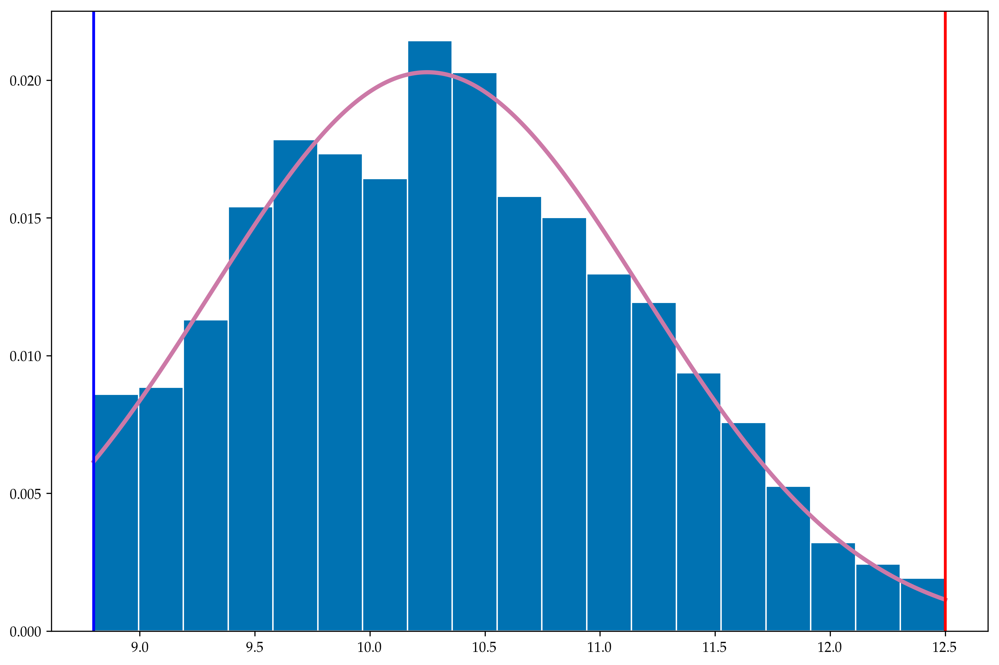

PyObject <matplotlib.lines.Line2D object at 0x13fa54e10>

In [98]:
function plot_top()
    i = 23
    j = 52
    sample_min, sample_max = find_min_max(X_stacked)
    j_is_max = sample_max .== j
    n_top = sum(j_is_max)
    n_samples = size(X_stacked, 1)
    bins = linspace(Xmin,Xmax,20)
    dx = median(diff(bins))
    plt.plt[:hist](X_stacked[j_is_max, i],
                   weights=ones(n_top)./n_samples./dx,
                   color=cbbPalette[5],
                   edgecolor="white",
                   bins=bins)
    anal_top_pdf = TruncatedNormal(μ_i[i]+mean_m, σ_i[i], Xmin, Xmax)
    n_hist = 1000
    xx = linspace(Xmin, Xmax, n_hist)
    plt.plot(xx, 
             (P_j[j]-Pij[i,j]).*pdf.(anal_top_pdf, xx), 
             linewidth=3, 
             color=cbbPalette[7])
    plt.axvline(x=Xmin, color="blue", linewidth=2)
    plt.axvline(x=Xmax, color="red", linewidth=2)
end
plot_top()

## right margin

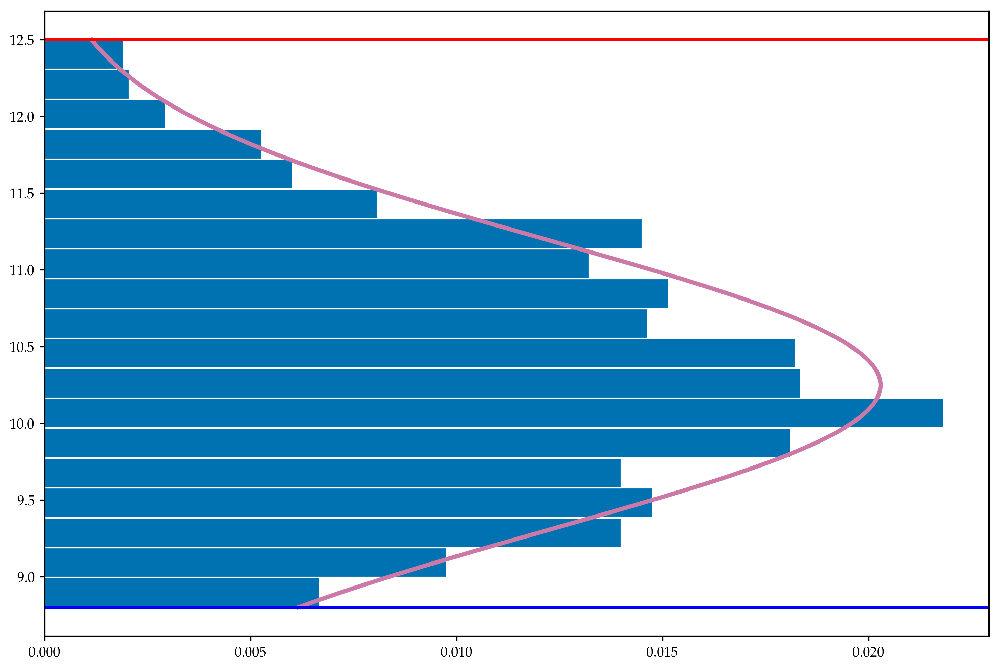

PyObject <matplotlib.lines.Line2D object at 0x13c521940>

In [99]:
function plot_right(;orientation="vertical")
    i = 23
    j = 52
    sample_min, sample_max = find_min_max(X_stacked)
    i_is_max = sample_max .== i
    n_right = sum(i_is_max)
    n_samples = size(X_stacked, 1)
    bins = linspace(Xmin,Xmax,20)
    dx = median(diff(bins))
    plt.plt[:hist](X_stacked[i_is_max, j],
                   weights=ones(n_right)./n_samples./dx,
                   color=cbbPalette[5],
                   edgecolor="white",
                   bins=bins,
                   orientation=orientation
                   )
    anal_right_pdf = TruncatedNormal(μ_i[j]+mean_m, σ_i[j], Xmin, Xmax)
    n_hist = 1000
    xx = linspace(Xmin, Xmax, n_hist)
    if orientation=="vertical"
        plt.plot(xx, 
                 (P_j[i]-Pij[j,i]).*pdf.(anal_right_pdf, xx), 
                 linewidth=3, 
                 color=cbbPalette[7])
        plt.axvline(x=Xmin, color="blue", linewidth=2)
        plt.axvline(x=Xmax, color="red", linewidth=2)
    elseif orientation=="horizontal"
        plt.plot((P_j[i]-Pij[j,i]).*pdf.(anal_right_pdf, xx), 
                 xx,
                 linewidth=3, 
                 color=cbbPalette[7])
        plt.axhline(y=Xmin, color="blue", linewidth=2)
        plt.axhline(y=Xmax, color="red", linewidth=2)
    end
end
plot_right(orientation="horizontal")

## All together

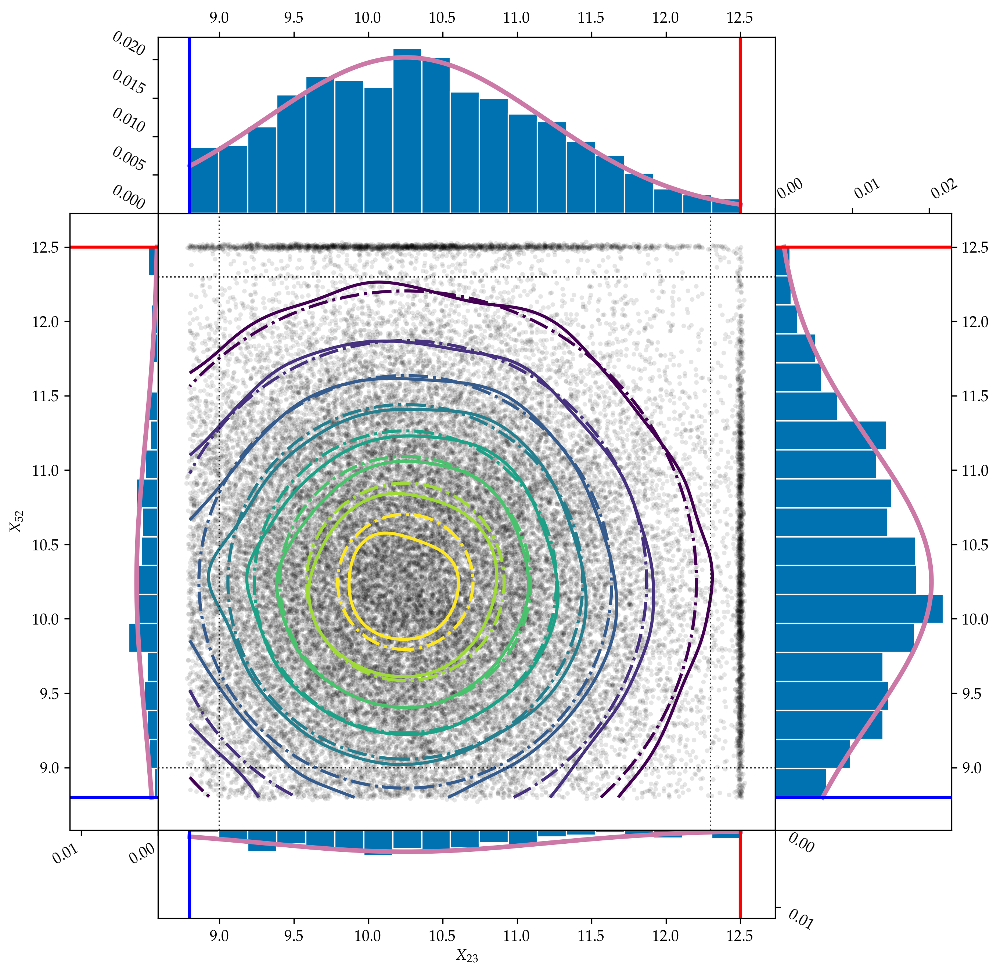

In [129]:
tr_width = 0.2
bl_width = 0.1
left, width = bl_width, 1 - tr_width-bl_width
bottom, height = bl_width, 1 - tr_width-bl_width

rect_scatter =   [left, bottom, width, height]
rect_hist_top =   [left, bottom+height, width, tr_width]
rect_hist_bottom = [left, 0.0, width, bl_width]
rect_hist_right = [left+width, bottom, tr_width, height]
rect_hist_left = [0.0, bottom, bl_width, height]

# start with a rectangular Figure
plt.figure(1, figsize=(8, 8))

axScatter = plt.axes(rect_scatter)
axHist_top = plt.axes(rect_hist_top)
axHist_bottom = plt.axes(rect_hist_bottom)
axHist_right = plt.axes(rect_hist_right)
axHist_left = plt.axes(rect_hist_left)

plt.sca(axScatter)
plot_contours(;plot_minmax=false)
plot_scatter()
_xlim = plt.xlim()
_ylim = plt.ylim()

nullfmt = plt.matplotlib[:ticker][:NullFormatter]()
axScatter[:xaxis][:set_major_formatter](nullfmt)
axScatter[:yaxis][:set_major_formatter](nullfmt)

plt.sca(axHist_top)
plot_top()
plt.xlim(_xlim)

plt.sca(axHist_right)
plot_right(;orientation="horizontal")
# base = plt.gca()[:transData]
# rot = plt.matplotlib[:transforms][:Affine2D]()[:rotate_deg](90.0)
plt.ylim(_ylim)

plt.sca(axHist_bottom)
plot_bottom()
plt.xlim(_xlim)


plt.sca(axHist_left)
plot_left(;orientation="horizontal")
plt.ylim(_ylim)

max_margin = 0.0
plt.sca(axHist_top)
max_margin = max(max_margin, plt.ylim()[2])
plt.sca(axHist_right)
max_margin = max(max_margin, plt.xlim()[2])
plt.sca(axHist_bottom)
max_margin = max(max_margin, plt.ylim()[2])
plt.sca(axHist_left)
max_margin = max(max_margin, plt.xlim()[2])

plt.sca(axHist_bottom)
plt.xlabel(L"$X_{23}$")
plt.sca(axHist_left)
plt.ylabel(L"$X_{52}$")

axHist_top[:xaxis][:tick_top]()
axHist_top[:xaxis][:set_label_position]("top")
for label in axHist_top[:get_yticklabels]()
    label[:set_rotation](-30)
    label[:set_va]("bottom")
end

axHist_right[:xaxis][:tick_top]()
axHist_right[:xaxis][:set_label_position]("top")
axHist_right[:yaxis][:tick_right]()
axHist_right[:yaxis][:set_label_position]("right")
for label in axHist_right[:get_xticklabels]()
    label[:set_rotation](30)
    label[:set_ha]("left")
end

axHist_bottom[:yaxis][:tick_right]()
axHist_bottom[:yaxis][:set_label_position]("right")
for label in axHist_bottom[:get_yticklabels]()
    label[:set_rotation](-30)
    label[:set_va]("top")
end

for label in axHist_left[:get_xticklabels]()
    label[:set_rotation](30)
    label[:set_ha]("right")
end

plt.sca(axHist_top)
plt.ylim(0, max_margin)
plt.sca(axHist_right)
plt.xlim(0, max_margin)
plt.sca(axHist_bottom)
plt.ylim(0, max_margin/2)
plt.sca(axHist_left)
plt.xlim(0, max_margin/2)

plt.sca(axHist_bottom)
axHist_bottom[:invert_yaxis]()

plt.sca(axHist_left)
axHist_left[:invert_xaxis]()

cd(_pwd)
plt.savefig("../figures/toy_joint.png", bbox_inches="tight")
plt.savefig("../figures/toy_joint.pdf", bbox_inches="tight")
;

# Comparison

In [130]:
function title_in_axis(s)
    plt.text(0.95, 0.9, s,
         horizontalalignment="right",
         verticalalignment="top",
         transform = plt.gca()[:transAxes])
end

title_in_axis (generic function with 1 method)

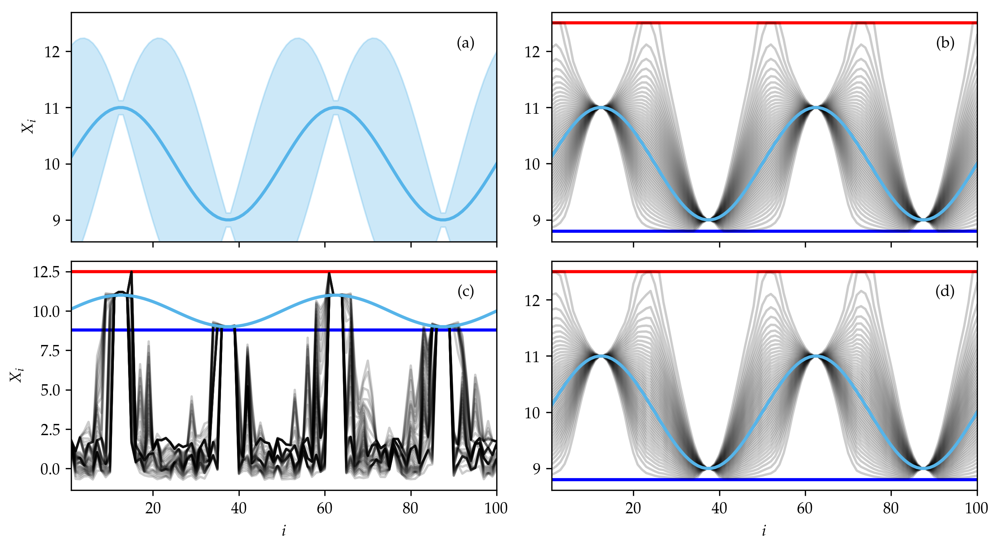

In [138]:
fig = plt.gcf()
fig[:set_size_inches](9.0,5.0)

plt.subplot(2,2,4)
plot_stan(sim)
_ylim = plt.ylim()
plt.title("")
title_in_axis("(d)")
plt.ylabel("")

plt.subplot(2,2,1)
plot_prior()
plt.ylim(_ylim)
plt.title("")
title_in_axis("(a)")
plt.xlabel("")
plt.gca()[:set_xticklabels]([])

plt.subplot(2,2,2)
plot_analy()
plt.title("")
title_in_axis("(b)")
plt.xlabel("")
plt.ylabel("")
plt.gca()[:set_xticklabels]([])

plt.subplot(2,2,3)
plot_stan(sim_nosmooth)
plt.title("")
title_in_axis("(c)")

cd(_pwd)
plt.gcf()[:tight_layout]()
plt.savefig("../figures/toy_quantiles.png", bbox_inches="tight")
plt.savefig("../figures/toy_quantiles.pdf", bbox_inches="tight")
;